In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
from matplotlib.gridspec import GridSpecFromSubplotSpec

import networkx as nx

import os
import os.path as op

import importlib

import dgsp
import graph_examples as dgsp_graphs
import plotting as dgsp_plot

import bimod_plots as plot

([], [])

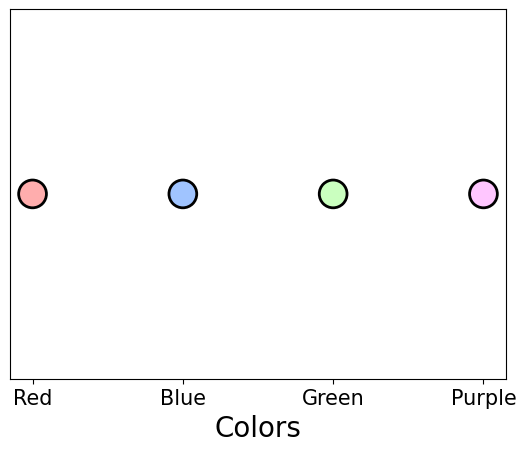

In [2]:
path_to_figures = "/Users/acionca/Google Drive/My Drive/01-Work/01-EDEE/meetings/10.15.24-miplab/figures"

os.makedirs(path_to_figures, exist_ok=True)

from matplotlib.colors import to_rgb
# Red, Blue, Green, Purple
colorpalette = ["#FFADAD", "#A0C4FF", "#CAFFBF", "#FFC6FF"]
palette_rgb = [to_rgb(color) for color in colorpalette]
colors_edges = np.array(["tab:red", "tab:blue", "tab:green", "tab:gray"])
markers = ["s", "o", "D", "^"]

# Defining edge alphas and connection styles
edge_a=.2
edge_cs="arc3,rad=0.2"

plt.scatter([0, 1, 2, 3], [0]*4, c=palette_rgb, s=400, edgecolors="k", lw=2)

plt.xlabel("Colors", fontsize=20)
plt.xticks([0, 1, 2, 3], ["Red", "Blue", "Green", "Purple"], fontsize=15)

plt.yticks([])

In [3]:
def bimod_proj(
        matrix, ax, vector_id = 0, directed_edges = True, node_clusers = None, **kwargs
        ):

    # Building the modularity matrix
    modmat = dgsp.modularity_matrix(matrix, null_model="outin")

    U, S, Vh = dgsp.sorted_SVD(modmat, **kwargs)
    V = Vh.T

    n_nodes = matrix.shape[0]
    n_per_com = n_nodes // 4

    graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}

    if node_clusers is None:
        node_clusers = np.ones(n_nodes)

    if ax is None:
        _, ax = plt.subplots(figsize=(8, 8))

    if directed_edges:
        graph = nx.DiGraph(matrix)
    else:
        graph = nx.Graph(matrix)

    nx.draw_networkx_edges(graph, pos=graph_pos, alpha=0.02, ax=ax)

    cmap = plt.get_cmap("plasma", int(node_clusers.max() + 1))
    colors = [cmap(int(i)) for i in node_clusers]

    ax.scatter(
        U[:, vector_id],
        V[:, vector_id],
        s=200,
        color=colors,
        edgecolor="k",
        linewidth=2,
        zorder=2,
    )

    return ax

[]

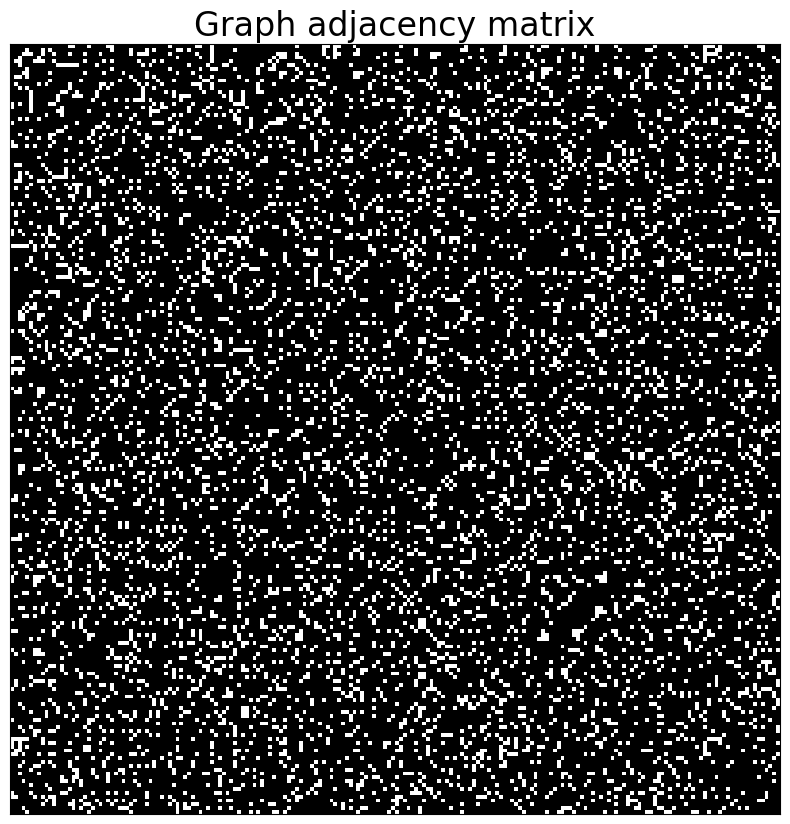

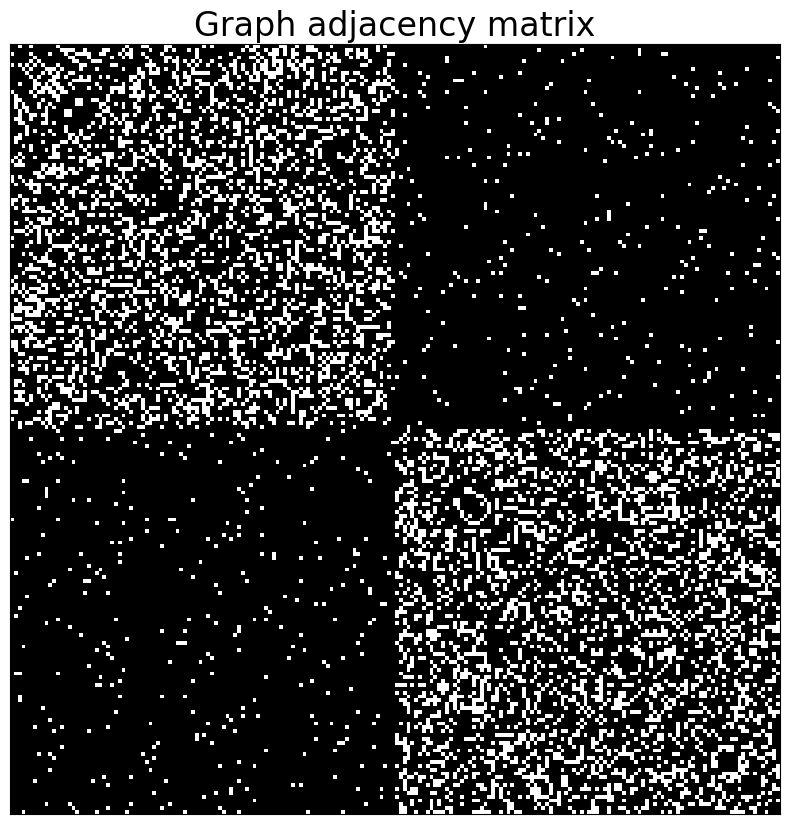

In [8]:
importlib.reload(plot)

n_per_com = 50
density_value = .3
density_con = density_value/10
eig_id = 0

write_s = True
for_overleaf = True

# Building the graph
graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
                                      connect_density=[density_value, density_con, density_con, 
                                                       density_con, density_con, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, 0.5, 1, 0], seed=1234)

graph += graph.T

shuffle = np.arange(graph.shape[0])
np.random.shuffle(shuffle)
graph_shuffle = graph[shuffle][:, shuffle]

fig, axes = plt.subplots(figsize=(10, 10))

plot.plot_adjacency(graph_shuffle, ax=axes, use_cmap=False)
axes.set_xticks([])
axes.set_yticks([])

#fig.savefig(op.join(path_to_figures, "01-community-toyShuffle.png"), dpi=300, bbox_inches="tight")

fig, axes = plt.subplots(figsize=(10, 10))
plot.plot_adjacency(graph, ax=axes, use_cmap=False)

axes.set_xticks([])
axes.set_yticks([])

#fig.savefig(op.join(path_to_figures, "01-community-toyOrdered.png"), dpi=300, bbox_inches="tight")

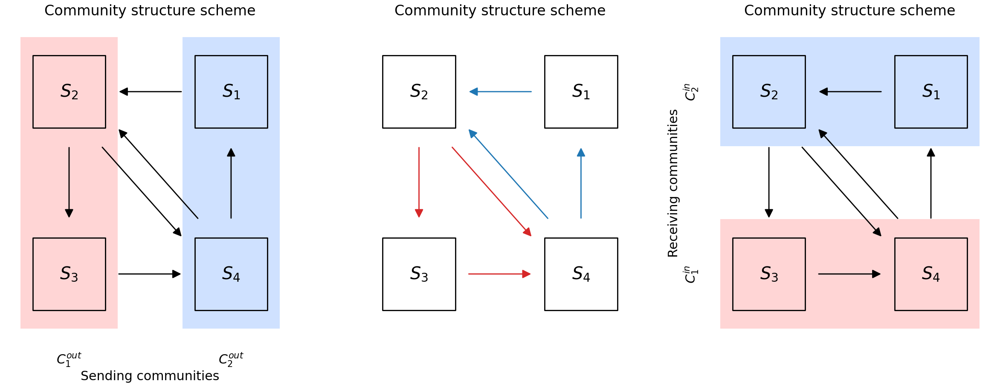

In [ ]:
importlib.reload(plot)

from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection

fig, axes = plt.subplots(ncols=3, figsize=(30, 10))

axes[0] = plot.plot_community_scheme(ax=axes[0], com_names=["$S_3$", "$S_4$", "$S_2$", "$S_1$"],
                                     use_cmap=False, x_names=["$C^{{out}}_1$", "$C^{{out}}_2$"])
axes[0].set_yticks([])
axes[0].set_ylabel("")

x_pos = [-0.8, 0.2]
highlights = [Rectangle((x, -0.8), 0.6, 1.6) for i, x in enumerate(x_pos)]

pc = PatchCollection(highlights, facecolor=np.array(palette_rgb)[[0, 1]], alpha=0.5, zorder=0)
axes[0].add_collection(pc)

axes[1] = plot.plot_community_scheme(ax=axes[1], com_names=["$S_3$", "$S_4$", "$S_2$", "$S_1$"],
                                     use_cmap=False, arrow_colors=colors_edges[[0, 1, 1, 0, 1, 0]])
axes[1].set_xticks([])
axes[1].set_xlabel("")
axes[1].set_yticks([])
axes[1].set_ylabel("")


axes[2] = plot.plot_community_scheme(ax=axes[2], com_names=["$S_3$", "$S_4$", "$S_2$", "$S_1$"],
                                     use_cmap=False, y_names=["$C^{{in}}_1$", "$C^{{in}}_2$"])
axes[2].set_xticks([])
axes[2].set_xlabel("")

x_pos = [-0.8, 0.2]
highlights = [Rectangle((-0.8, x), 1.6, 0.6) for i, x in enumerate(x_pos)]

pc = PatchCollection(highlights, facecolor=np.array(palette_rgb)[[0, 1]], alpha=0.5, zorder=0)
axes[2].add_collection(pc)

fig.savefig(op.join(path_to_figures, "02-community-toy-schemeExtended.png"), dpi=300, bbox_inches="tight")

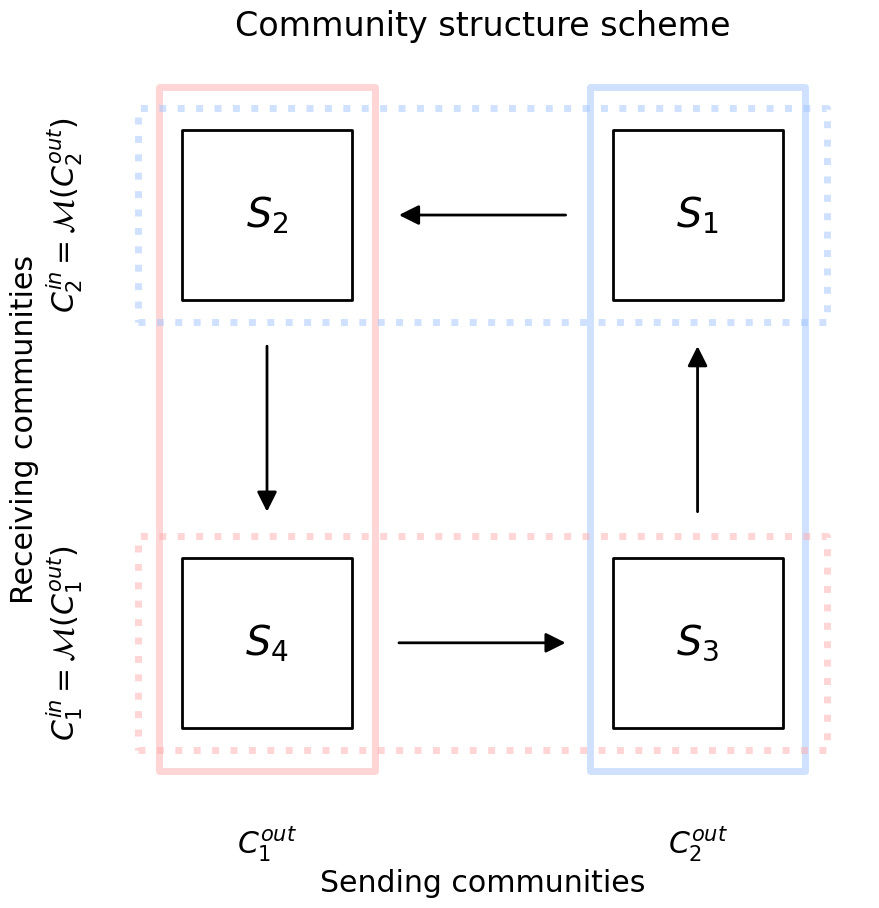

In [13]:
importlib.reload(plot)

from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection

send_only = False
receive_only = False

fig, axes = plt.subplots(ncols=1, figsize=(10, 10))

axes = plot.plot_community_scheme(ax=axes, com_names=["$S_4$", "$S_3$", "$S_2$", "$S_1$"], use_cmap=False, 
                                  x_names=["$C^{{out}}_1$", "$C^{{out}}_2$"],
                                  y_names=["$C^{{in}}_1=\mathcal{{M}}(C^{{out}}_1)$", "$C^{{in}}_2=\mathcal{{M}}(C^{{out}}_2)$"],
                                  arrow_colors=["k"]*6, plot_cycle=True)
                                  #arrow_colors=colors_edges[[0, 1, 1, 0, 1, 0]], plot_cycle=True)

if not receive_only:
    x_pos = [-0.75, 0.25]
    highlights = [Rectangle((x, -0.8), 0.5, 1.6) for i, x in enumerate(x_pos)]

    pc = PatchCollection(highlights, facecolor="none", edgecolor=np.array(palette_rgb)[[0, 1]], alpha=0.5, lw=5, zorder=0)
    #pc = PatchCollection(highlights, facecolor=np.array(palette_rgb)[[0, 1]], alpha=0.4, zorder=0)
    axes.add_collection(pc)

if not send_only:
    x_pos = [-0.75, 0.25]
    highlights = [Rectangle((-0.8, x), 1.6, 0.5) for i, x in enumerate(x_pos)]

    pc = PatchCollection(highlights, facecolor="none", edgecolor=np.array(palette_rgb)[[0, 1]], alpha=0.5, lw=5, ls=":", zorder=0)
    #pc = PatchCollection(highlights, facecolor=np.array(palette_rgb)[[0, 1]], alpha=0.4, zorder=0)
    axes.add_collection(pc)

#fig.savefig(op.join(path_to_figures, f"02-community-toy-schemeCompactLines{'-Send'*send_only}{'-Receive'*receive_only}.png"), dpi=300, bbox_inches="tight")
fig.savefig(op.join(path_to_figures, f"02-BlockCycle-schemeCompactLines{'-Send'*send_only}{'-Receive'*receive_only}.png"), dpi=300, bbox_inches="tight")

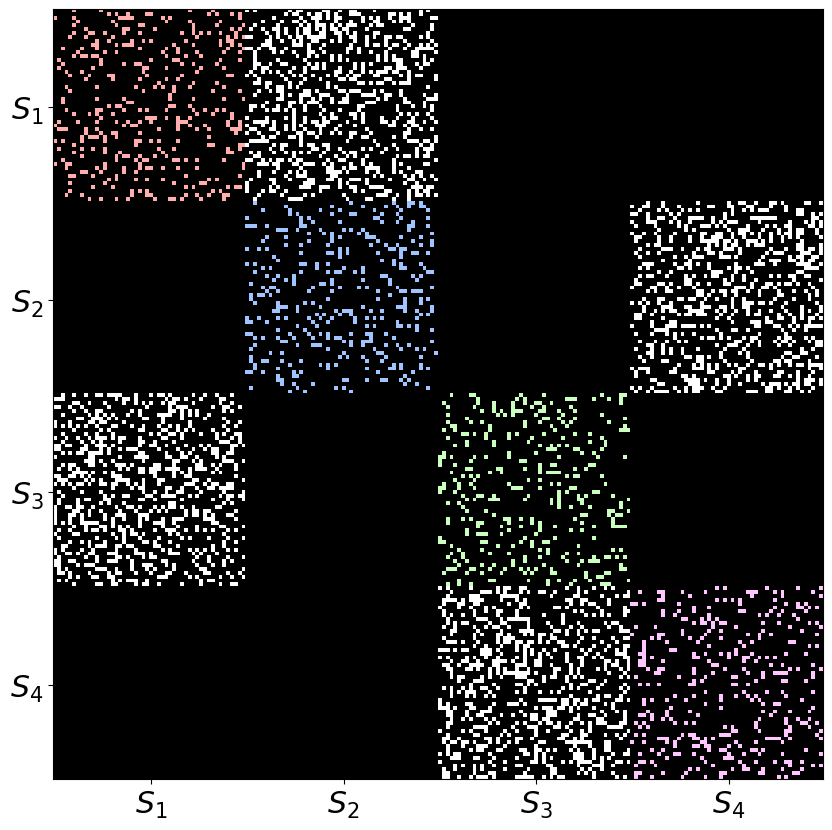

In [10]:
fig, axes = plt.subplots(ncols=1, figsize=(10, 10))

# Building the graph
graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       0, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, 0.5, 1, 0], seed=1234)

axes = plot.plot_adjacency(graph, ax=axes, override_title="")

fig.savefig(op.join(path_to_figures, "03-community-toyBlockCycle-adjacency.png"), dpi=300, bbox_inches="tight")

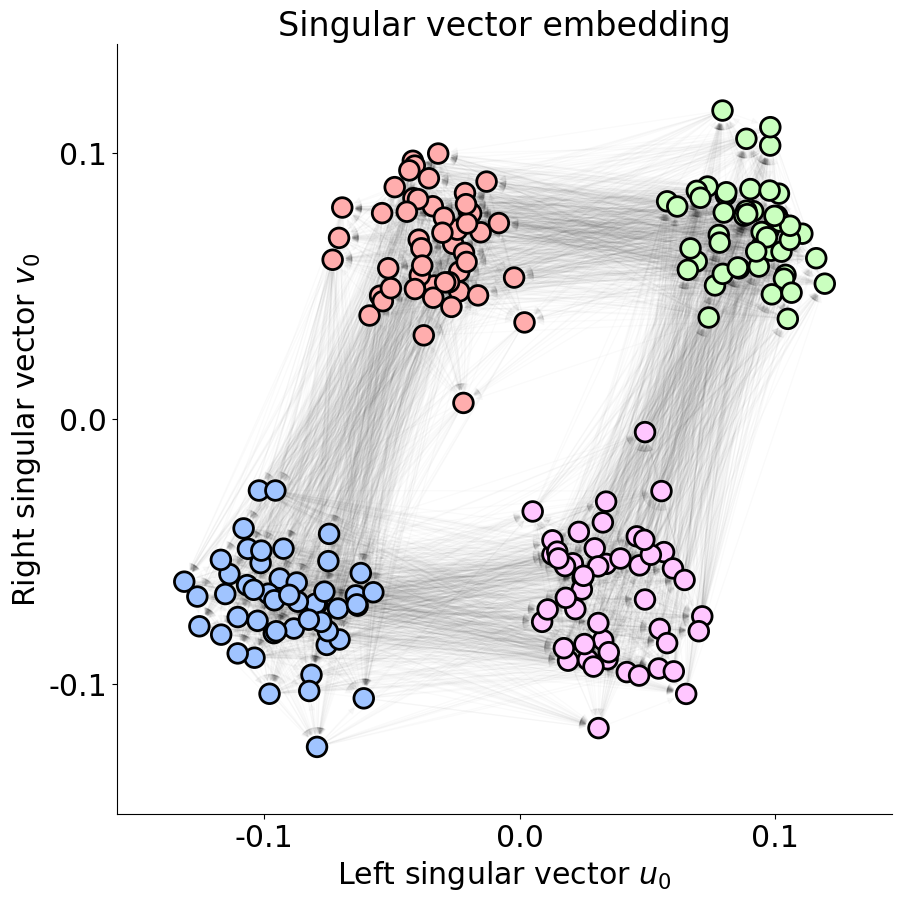

In [11]:
fig, axes = plt.subplots(ncols=1, figsize=(10, 10))

eig_id = 0
axes = plot.plot_graph_embedding(graph, vector_id=eig_id, ax=axes)

fig.savefig(op.join(path_to_figures, "04-community-toyBlockCycle-embedding.png"), dpi=300, bbox_inches="tight")

# C.elegans

In [16]:
path_to_adj = "data/SI 5 Connectome adjacency matrices, corrected July 2020.xlsx"
neuron_adj_df = pd.ExcelFile(path_to_adj)
print("Sheet names are:", neuron_adj_df.sheet_names)

chem_df = neuron_adj_df.parse("hermaphrodite chemical")

# Getting neuron informations
# Dropping Nans
neuron_def_df = chem_df.iloc[:, :3].dropna(how="all").ffill()
neuron_def_df.columns = ["Type", "Detail", "Neuron"]
# Dropping Pharynx neurons
neuron_def_df = neuron_def_df[neuron_def_df.Type != "PHARYNX"].reset_index(drop=True)

lab_to_id = {lab: i for i, lab in enumerate(neuron_def_df["Neuron"].values)}

# Adding landmark information (average position on antero-posterior axis)
path_to_neurons_types = "data/NeuronFixedPoints.xls"
neuron_AvgLandmarkPos = pd.read_excel(path_to_neurons_types).groupby("Neuron")["Landmark Position"].mean()

neuron_def_df = neuron_def_df.merge(neuron_AvgLandmarkPos, on="Neuron", how="left")

# Order Neurons by Type and Landmark Position
#neuron_def_df = neuron_def_df.sort_values(["Type", "Landmark Position"])

type_to_num = {t: i for i, t in enumerate(neuron_def_df["Type"].unique())}
neuron_def_df["Type_num"] = [type_to_num[t] for t in neuron_def_df["Type"]]

all_labels = neuron_def_df["Neuron"].values.tolist()
print(f"There are {len(all_labels)} neurons in the dataset")

fixed_details = [lab.replace(" MOTOR NEURONS", "") if "MOTOR NEURONS" in str(lab) else lab for lab in neuron_def_df.loc[:, "Detail"]]
neuron_def_df.loc[:, "Detail"] = fixed_details

neuron_def_df["Type_long"] = neuron_def_df["Type"]+"_"+neuron_def_df["Detail"].astype(str)

type_long_to_num = {t: i for i, t in enumerate(neuron_def_df["Type_long"].unique())}
neuron_def_df["TypeLong_num"] = [type_long_to_num[t] for t in neuron_def_df["Type_long"]]

print(neuron_def_df.loc[:, "Type_long"].unique())

path_to_bullmore = "data/celegans-bullmore"
bullmore_file = "Worm279dir.mat"

no_sex = True
gap_junc = False

from scipy.io import loadmat
import os.path as op

bullmore_dict = loadmat(op.join(path_to_bullmore, bullmore_file))

print(bullmore_dict.keys())

bullmore_adj_sum = bullmore_dict["Worm279_matrix_dir"]
bullmore_adj_gap = bullmore_dict["Worm279_ejunct_matrix_dir"]
bullmore_adj_chem = bullmore_dict["Worm279_synapse_matrix_dir"]

bullmore_label = np.array([lab[0][0] for lab in bullmore_dict["Worm279_labels"]])
bullmore_type = [neuron_def_df[neuron_def_df["Neuron"] == lab]["Type"].values[0] for lab in bullmore_label]
bullmore_type_num = [neuron_def_df[neuron_def_df["Neuron"] == lab]["Type_num"].values[0] for lab in bullmore_label]
bullmore_landmark = [neuron_def_df[neuron_def_df["Neuron"] == lab]["Landmark Position"].values[0] for lab in bullmore_label]

bullmore_pos = bullmore_dict["Worm279_positions"]

# REMOVE SEX SPECIFIC NEURONS
if no_sex:
    no_sex_spec = np.array(bullmore_type_num, dtype=int) < 3
    bullmore_type = np.array(bullmore_type)[no_sex_spec]
    bullmore_type_num = np.array(bullmore_type_num)[no_sex_spec]
    bullmore_label = np.array(bullmore_label)[no_sex_spec]
    bullmore_pos = np.array(bullmore_pos)[no_sex_spec]
    bullmore_adj_gap = np.array(bullmore_adj_gap)[no_sex_spec][:, no_sex_spec]
    bullmore_adj_chem = np.array(bullmore_adj_chem)[no_sex_spec][:, no_sex_spec]

bullmore_to_label = [lab_to_id[lab] for lab in bullmore_label]
label_to_bullmore = np.argsort(bullmore_to_label)

gap_adj_bull = bullmore_adj_gap[bullmore_to_label][:, bullmore_to_label]
chem_adj_bull = bullmore_adj_chem[bullmore_to_label][:, bullmore_to_label]

chen_adj = bullmore_dict["Worm279_matrix"]
whole_adj_chen = chen_adj[bullmore_to_label][:, bullmore_to_label]

bullmore_label_cleaned = bullmore_label[label_to_bullmore]

thresh = 0
if gap_junc:
    wiring_adj = bullmore_adj_gap+bullmore_adj_chem
else:
    wiring_adj = bullmore_adj_chem
wiring_adj -= np.diag(np.diag(wiring_adj))
wiring_sym = (wiring_adj > thresh).astype(int)
#wiring_sym = (wiring_adj).astype(int)
wiring_mod = dgsp.modularity_matrix(wiring_sym, null_model="outin")
print(f"Asymmetric wiring matrix has shape {wiring_sym.shape}")

nodes_labels = bullmore_label

d_mat = np.diag(wiring_sym.sum(axis=1))
print("k_out", wiring_sym.sum(axis=1).min(), wiring_sym.sum(axis=1).max())
print("k_in", wiring_sym.sum(axis=0).min(), wiring_sym.sum(axis=0).max())

#U, S, Vh = svd(wiring_mod)
#U, S, Vh = dgsp.sorted_SVD(wiring_mod)
U, S, Vh = dgsp.sorted_SVD(wiring_mod, fix_negative=False)
V = Vh.T

print("mean of V^T U:", np.diag(Vh@U).mean())

sort_idx = np.flip(np.argsort(S))
S = S[sort_idx]
U = U[:, sort_idx]
V = V[:, sort_idx]

Sheet names are: ['TITLE AND LEGEND', 'hermaphrodite chemical', 'hermaphrodite gap jn asymmetric', 'hermaphrodite gap jn symmetric', 'male chemical', 'male gap jn asymmetric', 'male gap jn symmetric']
There are 280 neurons in the dataset
['SENSORY NEURONS_6' 'SENSORY NEURONS_5' 'SENSORY NEURONS_4'
 'SENSORY NEURONS_3' 'SENSORY NEURONS_2' 'SENSORY NEURONS_1'
 'INTERNEURONS_4' 'INTERNEURONS_3' 'INTERNEURONS_2' 'INTERNEURONS_1'
 'MOTOR NEURONS_HEAD' 'MOTOR NEURONS_SUBLATERAL'
 'MOTOR NEURONS_VENTRAL CORD' 'SEX SPECIFIC_VENTRAL CORD']
dict_keys(['__header__', '__version__', '__globals__', 'Worm279_birthtime', 'Worm279_labels', 'Worm279_positions', 'Worm279_elist_connectiontype', 'Worm279_elist_connectionstrength', 'Worm279_Wmatrix', 'Worm279_matrix', 'Worm279_synapse_matrix_dir', 'Worm279_ejunct_matrix_dir', 'Worm279_matrix_dir'])
Asymmetric wiring matrix has shape (272, 272)
k_out 0 49
k_in 0 53
mean of V^T U: -0.06503847524128842


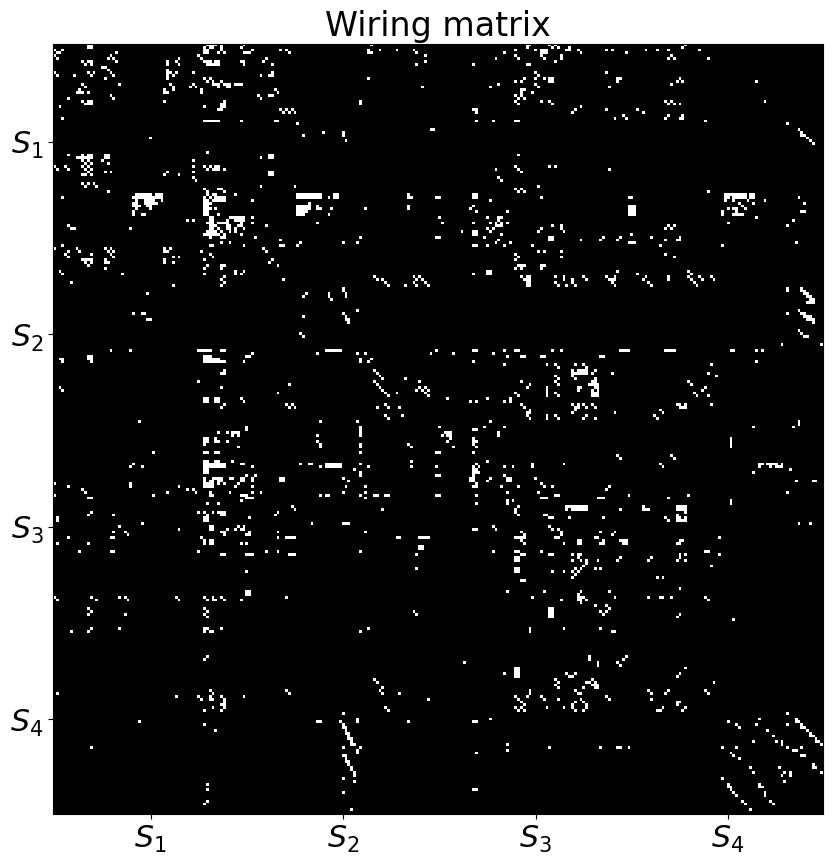

In [17]:
fig, axes = plt.subplots(ncols=1, figsize=(10, 10))

axes = plot.plot_adjacency(wiring_sym, override_title="Wiring matrix", use_cmap=False, ax=axes)

fig.savefig(op.join(path_to_figures, "05-celegans-matrix.png"), dpi=300, bbox_inches="tight")

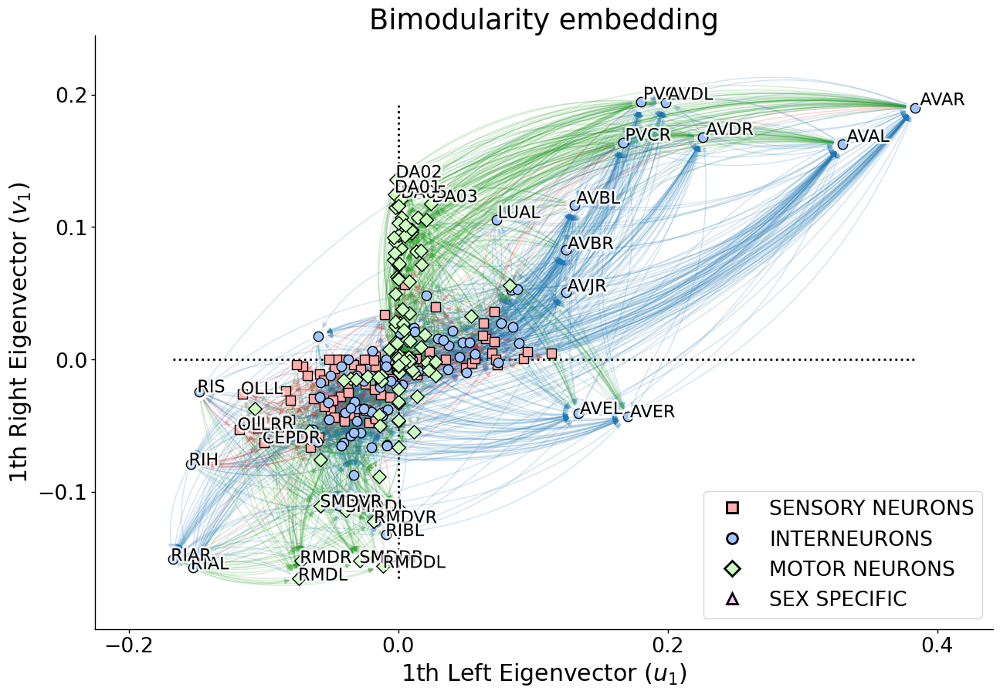

In [18]:
# Composite Figure
from matplotlib.colors import hsv_to_rgb
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke

importlib.reload(plot)

import matplotlib
matplotlib.rcParams['axes.linewidth'] = 1
matplotlib.rcParams['xtick.major.width'] = 1
matplotlib.rcParams['ytick.major.width'] = 1


fontscale = 1.2
alpha_perc = 88
show_markers = True
uneven_ratios = 0.5
testing = False
eig_id = np.where(S > 1e-10)[0][0]
#eig_id = -1

fig, all_axes = plt.subplots(figsize=(15, 10))
suffix = "Rect" + "_".join([f"{inch:1.0f}" for inch in fig.get_size_inches()])

axes = [all_axes, all_axes]

#################################################################################
###     Second plot
#################################################################################
graph = nx.DiGraph(wiring_sym)
graph_pos = {i: (U[i, eig_id], V[i, eig_id]) for i in range(wiring_sym.shape[0])}

if not testing:
    edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

    for i, (_, target) in enumerate(graph.edges()):
        edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == bullmore_label[target]]["Type_num"].values[0]
        
    colors = palette_rgb

    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.05)
    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.05, ax=axes[1])
    nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[1], edge_color=colors_edges[edge_colors],
                           alpha=edge_a, connectionstyle=edge_cs)

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]

    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    axes[1].scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
                    zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])

alpha_factor = 0.2
alpha_threshold = 0.45
squared_rad = U[:, eig_id] ** 2 + V[:, eig_id] ** 2
alpha_vector = squared_rad
alpha_vector = np.clip(alpha_vector/(alpha_vector.max() * alpha_factor), a_min=0, a_max=1)

alpha_vector[alpha_vector < alpha_threshold] = 0
alpha_vector = (squared_rad > np.percentile(squared_rad, alpha_perc)).astype(int)

sorted_by_radius = np.argsort(squared_rad)

#for i, neuron in enumerate(nodes_labels):
for i in sorted_by_radius:
    #if neuron in label_filter:
    if True:
        axes[1].text(1.01*U[i, eig_id], 1.01*V[i, eig_id], nodes_labels[i], fontsize=16, alpha=alpha_vector[i],
                     path_effects=[
                         withStroke(
                             linewidth=4,
                             foreground="w",
                             alpha=0.8*alpha_vector[i],
                             )])

x_max, y_max = np.max(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)
x_min, y_min = np.min(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)

abs_min = max([x_min, y_min])
abs_max = min([x_max, y_max])

#axes.plot([abs_min, abs_max], [abs_min, abs_max], color="tab:orange")
axes[1].plot([0, 0], [y_min, y_max], ls=":", lw=2, color="k", zorder=0)
axes[1].plot([x_min, x_max], [0, 0], ls=":", lw=2, color="k", zorder=0)

legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k", markerfacecolor=palette_rgb[i],
                          markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]

# Parameters
axes[1].set_title(f"Bimodularity embedding", fontsize=22 * fontscale)
#axes[1].set_title(f"Bimodularity embedding $s_{{{eig_id+1}}}={S[eig_id]:1.2f}$", fontsize=22 * fontscale)
axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16 * fontscale)
axes[1].set_xticks(np.linspace(-0.2, .4, 4))
axes[1].set_yticks(np.linspace(-.1, .2, 4))
axes[1].set_xlabel(f"{eig_id + 1}th Left Eigenvector ($u_{{{eig_id+1}}}$)", fontsize=18 * fontscale)
axes[1].set_ylabel(f"{eig_id + 1}th Right Eigenvector ($v_{{{eig_id+1}}}$)", fontsize=18 * fontscale)
axes[1].spines[["top", "right"]].set_visible(False)
#axes[1].legend(fontsize=16 * fontscale, loc="lower right")
axes[1].legend(handles=legend_elements, fontsize=16 * fontscale, loc="lower right")

if not testing:
    fig.savefig(op.join(path_to_figures, f"05-Celegans{eig_id:02d}-Projection-{suffix}.png"), dpi=300, bbox_inches="tight")

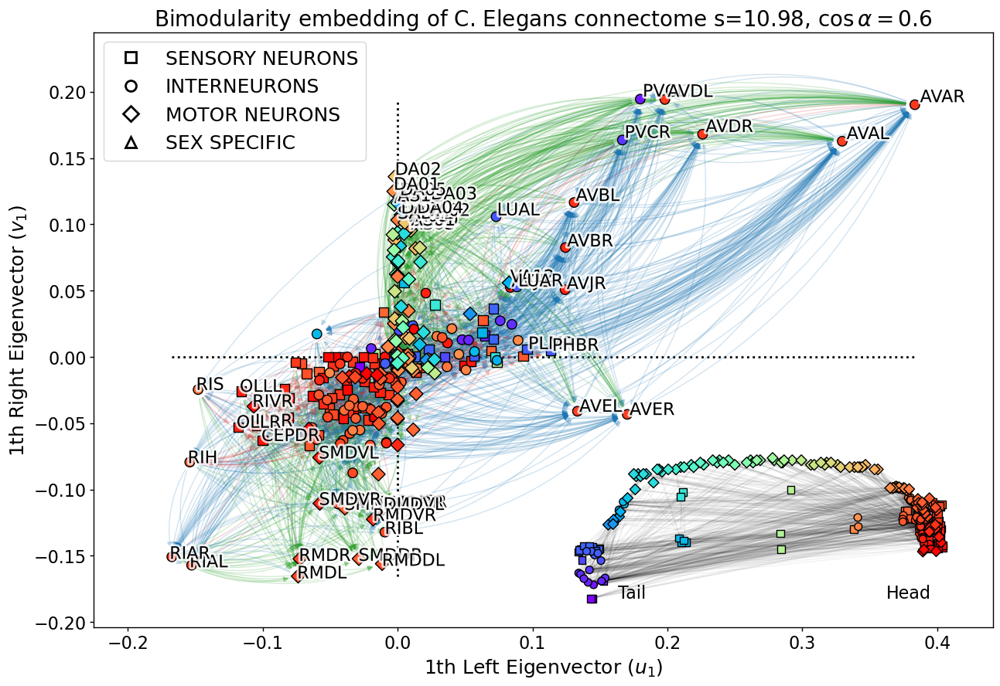

In [19]:
from matplotlib.lines import Line2D

n_cmap_points = 100
alpha_perc = 20
FAST = False

fig, axes = plt.subplots(figsize=(15, 10))

eig_id = np.where(S > 1e-10)[0][0]

graph = nx.DiGraph(wiring_sym)
graph_pos = {i: (U[i, eig_id], V[i, eig_id]) for i in range(wiring_sym.shape[0])}

edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

for i, (_, target) in enumerate(graph.edges()):
    edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == bullmore_label[target]]["Type_num"].values[0]
    
colors = palette_rgb

#nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.05)
if not FAST:
    nx.draw_networkx_edges(graph, pos=graph_pos, edge_color=colors_edges[edge_colors],
                        alpha=edge_a, connectionstyle=edge_cs)

x_norm = bullmore_pos[:, 0] + 0.4
y_norm = (bullmore_pos[:, 1] - bullmore_pos[:, 1].min())
ap_angle = np.arctan2(y_norm/np.abs(y_norm).max(), x_norm/np.abs(x_norm).max())
ap_angle = n_cmap_points*(ap_angle - ap_angle.min())/(ap_angle.max() - ap_angle.min())

angle_cmap = plt.get_cmap("rainbow_r", n_cmap_points)
ap_colors = np.array([angle_cmap(a) for a in ap_angle.astype(int)])

#axes_pos = [0.51, 0.128, 0.38, 0.22]
#axes_pos = [0.14, 0.128, 0.21, 0.11]
if eig_id == 1:
    axes_pos = [0.12, 0.128, 0.32, 0.16]
else:
    axes_pos = [0.51, 0.128, 0.38, 0.22]

#display_axes = fig.add_axes(axes_pos, facecolor="w")
display_axes = fig.add_axes(axes_pos, facecolor="none")
display_axes.spines[:].set_visible(False)
display_axes.text(0.5, 0, "Head", fontsize=16, ha="right")
display_axes.text(-0.5, 0, "Tail", fontsize=16)
graph_pos = {i: (x_norm[i], y_norm[i]) for i in range(wiring_sym.shape[0])}
if not FAST:
    nx.draw_networkx_edges(nx.Graph(wiring_sym), pos=graph_pos, alpha=.05, ax=display_axes)

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]

    #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    #axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
    #             zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])
    axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=ap_colors[type_mask], s=80, label=n_type,
                 zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])
    
    display_axes.scatter(x_norm[type_mask], y_norm[type_mask], color=ap_colors[type_mask],
                         s=50, edgecolor="k", lw=1, marker=markers[i])

#label_filter = ["AVAL", "AVAR", "AVEL", "AVER", "RIAR", "RIAL"]
label_filter = ["PHAL", "PHAR", "PHBL", "PHBR", "PHCR", "PHCL", "PLMR", "PLML"]
#for i, neuron in enumerate(bullmore_label):

squared_rad = U[:, eig_id] ** 2 + V[:, eig_id] ** 2
by_radius = np.argsort(squared_rad)
alpha_vector = (squared_rad > np.percentile(squared_rad, 100-alpha_perc)).astype(int)

#for i, neuron in enumerate(nodes_labels):
for i in by_radius:
    #if neuron in label_filter:
    #if nodes_labels[i] in label_filter:
    if True:
        #axes.text(1.01*U[i, eig_id], 1.01*V[i, eig_id], neuron, fontsize=16, alpha=alpha_vector[i],
        axes.text(1.01*U[i, eig_id], 1.01*V[i, eig_id], nodes_labels[i], fontsize=16, alpha=alpha_vector[i],
                  path_effects=[
                      withStroke(
                          linewidth=4,
                          foreground="w",
                          alpha=0.8*alpha_vector[i]
                          )])

x_max, y_max = np.max(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)
x_min, y_min = np.min(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)

abs_min = max([x_min, y_min])
abs_max = min([x_max, y_max])

#axes.plot([abs_min, abs_max], [abs_min, abs_max], color="tab:orange")
axes.plot([0, 0], [y_min, y_max], ls=":", lw=2, color="k", zorder=0)
axes.plot([x_min, x_max], [0, 0], ls=":", lw=2, color="k", zorder=0)

legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
                          markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]
#all_axes.legend(handles=legend_elements, loc="lower right", fontsize=16, title="Connection density")
axes.legend(handles=legend_elements, fontsize=18, loc="upper left")

axes.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
axes.set_xlabel(f"{eig_id + 1}th Left Eigenvector ($u_{eig_id+1}$)", fontsize=18)
axes.set_ylabel(f"{eig_id + 1}th Right Eigenvector ($v_{eig_id+1}$)", fontsize=18)
angle = U[:, eig_id] @ V[:, eig_id]
axes.set_title("Bimodularity embedding of C. Elegans connectome" + f" s={S[eig_id]:1.2f}, $\cos\\alpha={angle:1.1f}$", fontsize=20)

display_axes.set_xticks([])
_ = display_axes.set_yticks([])

# Figure-02-eig00-Uneven-v00-Overleaf.png
fig.savefig(op.join(path_to_figures, f"05-Celegans{eig_id:02d}-ProjectionBis-{suffix}.png"), dpi=300, bbox_inches="tight")

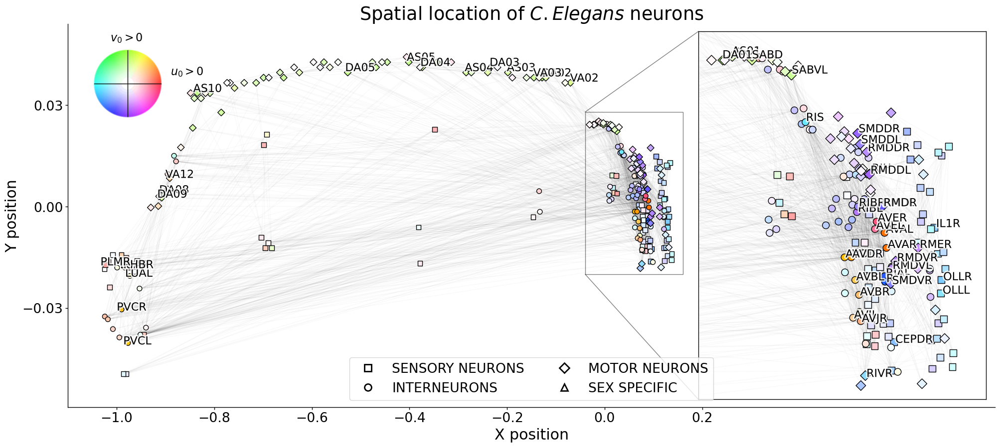

In [222]:
# Composite Figure
from matplotlib.colors import hsv_to_rgb
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

importlib.reload(plot)

import matplotlib
matplotlib.rcParams['axes.linewidth'] = 1
matplotlib.rcParams['xtick.major.width'] = 1
matplotlib.rcParams['ytick.major.width'] = 1


fontscale = 1.2
alpha_perc = 88
show_markers = True
uneven_ratios = 0.5
testing = True
eig_id = np.where(S > 1e-10)[0][0]
#eig_id = -1

#fig, all_axes = plt.subplots(nrows=2, figsize=(2*10, 2*10), height_ratios=[1 + uneven_ratios, 1])
fig, all_axes = plt.subplots(figsize=(24, 10))
suffix = "Rect" + "_".join([f"{inch:1.0f}" for inch in fig.get_size_inches()])

axes = [all_axes]*3

#################################################################################
###     Third plot
#################################################################################

angles = np.arctan2(U[:, eig_id], V[:, eig_id])
angles = np.arctan2(V[:, eig_id], U[:, eig_id])

angles_prop = angles/(2*np.pi)
angles_prop[angles_prop < 0] = 1+angles_prop[angles_prop < 0]

angle_offset = 0
angles_prop += angle_offset

percent_radius = 0.6
radius = np.sqrt(U[:, eig_id]**2 + V[:, eig_id]**2)
radius = np.clip(radius/(radius.max()*percent_radius), a_min=0, a_max=1)

by_radius = np.argsort(radius)

x_pos = bullmore_pos[:, 0]
y_pos = bullmore_pos[:, 1]

graph_pos = {i: (x, y) for i, (x, y) in enumerate(zip(x_pos, y_pos))}

colors = [hsv_to_rgb([a, r, 1]) for a, r in zip(angles_prop, radius)]

# Plotting the zoom
x1, x2, y1, y2 = -0.05, 0.17, -0.02, 0.028
x1, x2, y1, y2 = -0.04, 0.16, -0.02, 0.028
axes[2].set_xlim(-1.1, .8)

mask = np.logical_and(x_pos > x1, y_pos < y1)
subgraph = nx.Graph(wiring_sym[mask][:, mask])

axins = axes[2].inset_axes(
    #[0.7, 0.05, 0.28, 0.9],
    [0.68, 0.02, 0.31, 0.96],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])

axins.set_xticks([])
axins.set_yticks([])

graph = nx.Graph(wiring_sym)
nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[2], alpha=.025)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[2], alpha=.2,
#                       width=1.2, edge_color=colors_edges[edge_colors])

#axes[0].scatter(np.array(x_pos), np.array(y_pos), color=np.array(colors), s=200, alpha=.8, edgecolor="w", linewidths=1)
# axes[2].scatter(np.array(x_pos)[by_radius], np.array(y_pos)[by_radius], color=np.array(colors)[by_radius],
#                 s=100, alpha=.8, edgecolor="k", linewidths=1, zorder=2)

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]


    #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    #axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
    #             zorder=3, edgecolor="k", lw=1, alpha=1)
    
    #edge_colors = [(0, 0, 0, r) for r in radius[type_mask]]
    axes[2].scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                    s=50, edgecolor="k", lw=1, marker=markers[i], zorder=2)
    

    axins.scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                  s=100, edgecolor="k", lw=1, marker=markers[i], zorder=2)

for i, neuron in enumerate(bullmore_label):
    if x_pos[i] < x1 or y_pos[i] > y2:
        axes[2].text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16, alpha=alpha_vector[i],
                     path_effects=[
                         withStroke(
                             linewidth=4,
                             foreground="w",
                             alpha=0.8*alpha_vector[i],
                             )])

#axins.scatter(np.array(x_pos)[by_radius], np.array(y_pos)[by_radius], color=np.array(colors)[by_radius],
#              s=100, alpha=.8, edgecolor="k", linewidths=1, zorder=2)

nx.draw_networkx_edges(graph, pos=graph_pos, ax=axins, alpha=.025)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axins, alpha=.2, 
#                       width=1.2, edge_color=colors_edges[edge_colors])

for i, neuron in enumerate(bullmore_label):
    if x_pos[i] > x1 and y_pos[i] < y2:
        axins.text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16, alpha=alpha_vector[i],
                path_effects=[
                    withStroke(
                        linewidth=4,
                        foreground="w",
                        alpha=0.8*alpha_vector[i],
                        )])

axes[2].indicate_inset_zoom(axins, edgecolor="black")

# Plotting the colorbar
polar_pos = [0.14, 0.37, 0.07, 0.07]
polar_pos = [0.14, 0.74, 0.07, 0.14]
if uneven_ratios == 0.5:
    polar_pos = [0.14, 0.69, 0.07, 0.14]
elif uneven_ratios == 1:
    polar_pos = [0.14, 0.26, 0.07, 0.07]

display_axes = fig.add_axes(polar_pos, projection='polar')
#display_axes._direction = 2*np.pi 
#norm = Normalize(0.0, 2*np.pi)
#
#quant_steps = 512
#cb = ColorbarBase(display_axes, cmap=plt.get_cmap('hsv', quant_steps),
#                  norm=norm, orientation='horizontal')

quant_steps = 256
radius_power = 3
radius_max = 0.3

all_angles = np.linspace(0, 2*np.pi, quant_steps)[:-1]
all_radiuses = np.linspace(0, 1, quant_steps//4)

cmap = plt.get_cmap('hsv', quant_steps)

all_points = np.array([[a, r] for a in all_angles for r in all_radiuses])
all_colors = np.array([cmap(a/(2*np.pi))[:3] + (radius_max * r ** radius_power,) for a in all_angles for r in all_radiuses])

display_axes.scatter(all_points[:, 0], all_points[:, 1], s=20, color=all_colors, marker=".", edgecolors="none")

display_axes.plot([0, np.pi], [1]*2, ls="-", lw=1, color="k", zorder=2)
display_axes.plot([np.pi/2, -np.pi/2], [1]*2, ls="-", lw=1, color="k", zorder=2)

axes[2].text(-0.98, 0.049, f"$v_{{{eig_id}}}>0$", ha="center", fontsize=16)
axes[2].text(-0.89, 0.039, f"$u_{{{eig_id}}}>0$", fontsize=16)

# aesthetics - get rid of border and axis labels                                   
display_axes.set_axis_off()

legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
                          markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]

axes[2].set_title("Spatial location of $\it{C. Elegans}$ neurons", fontsize=22 * fontscale)
axes[2].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16 * fontscale)
axes[2].set_xticks(np.linspace(-1, .2, 7))
axes[2].set_yticks(np.linspace(-.03, .03, 3))
axes[2].set_xlabel("X position", fontsize=18 * fontscale)
axes[2].set_ylabel("Y position", fontsize=18 * fontscale)
axes[2].spines[["top", "right"]].set_visible(False)
#all_axes.legend(handles=legend_elements, loc="lower right", fontsize=16, title="Connection density")
axes[2].legend(handles=legend_elements, ncols=2, fontsize=16 * fontscale, loc="lower center")

if not testing:
    fig.savefig(op.join(path_to_figures, f"06-Celegans{eig_id:02d}-Anatomical-{suffix}.png"), dpi=300, bbox_inches="tight")

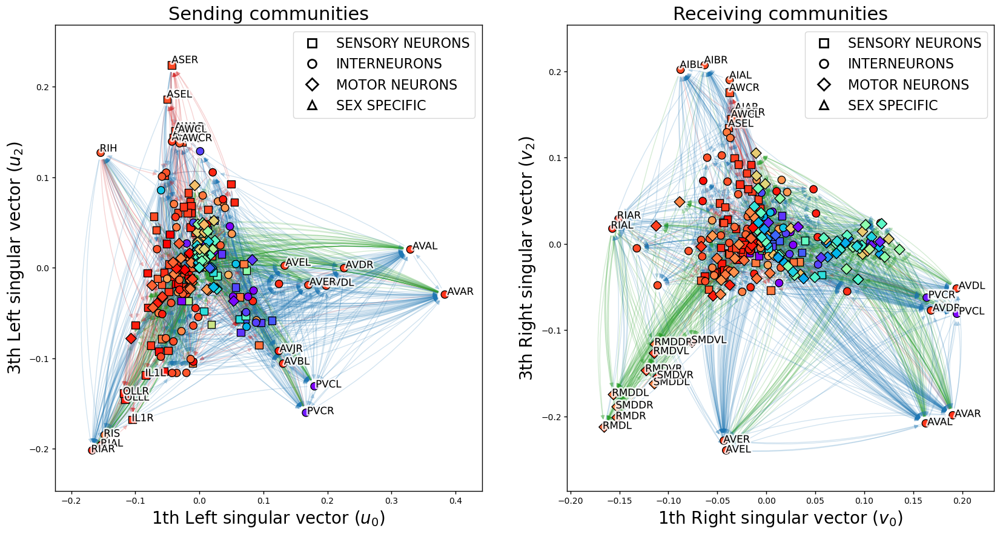

In [297]:
from matplotlib.patheffects import withStroke

fig, axes = plt.subplots(ncols=2, figsize=(20, 10))

eig_id = np.where(S > 1e-10)[0][0]
second_id = 2
rad_perc = 10

x_pos = bullmore_pos[:, 0]
y_pos = bullmore_pos[:, 1]

eig_name = ["u", "v"]
side = ["Left", "Right"]
for ax_i, (ax, eigenvector) in enumerate(zip(axes, [U, V])):

    graph = nx.DiGraph(wiring_sym)
    graph_pos = {i: (eigenvector[i, eig_id], eigenvector[i, eig_id+second_id]) for i in range(wiring_sym.shape[0])}
    
    mycmap = plt.get_cmap("tab20")
    colors_edge = np.array(["tab:red", "tab:blue", "tab:green", "tab:gray"])
    colors = np.array(palette_rgb)

    edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

    for i, (_, target) in enumerate(graph.edges()):
        edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == bullmore_label[target]]["Type_num"].values[0]
    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.1, ax=ax)

    #graph = nx.Graph(wiring_sym)
    nx.draw_networkx_edges(graph, pos=graph_pos, edge_color=colors_edge[edge_colors], alpha=.2, width=1, ax=ax, connectionstyle="arc3,rad=0.1")

    markers = ["s", "o", "D", "^"]
    for i, n_type in enumerate(neuron_def_df["Type"].unique()):
        neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]
    # for i, n_type in enumerate(neuron_def_df["Type_long"].unique()):
    #     neurons_in_type = neuron_def_df.loc[neuron_def_df["Type_long"] == n_type, "Neuron"]

        #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
        type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
        #ax.scatter(eigenvector[type_mask, eig_id], eigenvector[type_mask, eig_id+second_id], color=colors[i], s=80, label=n_type,
        avg_pos = x_pos - np.sign(x_pos + 0.5) * y_pos * 5
        ax.scatter(eigenvector[type_mask, eig_id], eigenvector[type_mask, eig_id+second_id], c=avg_pos[type_mask], cmap="rainbow", s=80, label=n_type,
                    zorder=3, edgecolor="k", marker=markers[i], lw=1)
        #ax.scatter(eigenvector[type_mask, eig_id], eigenvector[type_mask, eig_id+2], color=mycmap(i), s=80, label=n_type,
        #         zorder=3, edgecolor="w", lw=1)

    label_filter = ["AVAL", "AVAR", "AVEL", "AVER", "RIAR", "RIAL"]
    #for i, neuron in enumerate(bullmore_label):


    radius = eigenvector[:, eig_id]**2 + eigenvector[:, eig_id+second_id]**2
    for i, neuron in enumerate(nodes_labels):
        #if neuron in label_filter:
        #if True:
        if radius[i] > np.percentile(radius, 100 - rad_perc):
            ax.text(1.01*eigenvector[i, eig_id], 1.01*eigenvector[i, eig_id+second_id],
                    neuron, fontsize=12, 
                    path_effects=[withStroke(linewidth=4, foreground="w", alpha=0.8)])

    legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
                          markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]

    #ax.legend(handles=legend_elements, fontsize=16 * fontscale, loc="upper right")
    ax.legend(handles=legend_elements, fontsize=16, loc="upper right")

    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax.set_xlabel(f"{eig_id + 1}th {side[ax_i]} singular vector (${eig_name[ax_i]}_{{{eig_id}}}$)", fontsize=20)
    ax.set_ylabel(f"{eig_id + 1 + second_id}th {side[ax_i]} singular vector (${eig_name[ax_i]}_{{{eig_id + second_id}}}$)", fontsize=20)
    ax.set_title(f"{['Sending', 'Receiving'][ax_i]} communities", fontsize=22)
#axes.set_title("Eigenmodes embedding of C. Elegans connectome" + f" {U[:, eig_id].T@V[:, eig_id]:1.2f}")

#fig.savefig("eigenvectors_embedding.png", dpi=300, bbox_inches="tight")
fig.savefig(op.join(path_to_figures, f"06-Celegans-TwoComps{eig_id:02d}_{eig_id+second_id:02d}-Anatomical.png"), dpi=300, bbox_inches="tight")

# Human connectome

In [4]:
import numpy as np

import networkx as nx
import matplotlib.pyplot as plt
from seaborn import kdeplot

import os.path as op
import sys
path_to_effective = "../../effectivedelay_estimation"
sys.path.append(path_to_effective)

from src import regmod
from src import utils
from src import solver

import importlib

In [6]:
path_to_data = op.join(path_to_effective, "resources")

# Could be 50, 100, 200, 400
delay_max = 100
# delay_max = 50
#delay_max = 100
scale = 1

#path_to_data = f"/Users/acionca/data/F-TRACT-090624/{delay_max}" #/probability.txt.gz"
#path_to_ftract = f"/Users/acionca/data/F-TRACT-090624/{delay_max}" #/probability.txt.gz"

#filename = "adjacency_atlas.pkl"
filename = f"bundle_probability_atlas-scale{scale}.pkl"

bundle_prob = utils.load(op.join(path_to_data, filename))
bundle_prob = bundle_prob[:-2][:, :-2]
bundle_prob -= np.diag(np.diag(bundle_prob))
ftract_prob = utils.load(op.join(path_to_data, f"adj_probability_ftract-d{delay_max}-scale{scale}.pkl"))
ftract_prob = ftract_prob[:-2][:, :-2]

print(bundle_prob.shape)
print(ftract_prob.shape)

node_centers = utils.load(f"/Users/acionca/code/effectivedelay_estimation/resources/roi_centers-ftract-scale{scale}.pkl")[:82]

scale_to_nroi = {1:"33", 2:"60", 3:"125"}
#brain_regions_fname = "/Users/acionca/data/F-TRACT-090624/Lausanne2008-33 (1).txt"
#with open(brain_regions_fname) as f:
#    labels = f.readlines()
#labels = [lab.strip().split("ctx-")[-1] for lab in labels[:-2]]

brain_regions_fname = f"/Users/acionca/data/f-tract_v2112/ages_0_15/sr_8.40/seg_None_None/pl_200/Lausanne2008-{scale_to_nroi[scale]}/export/peak_latency/peak_latency.csv"
with open(brain_regions_fname) as f:
    labels = f.readlines()[5:]

labels = [lab.strip().split("ctx-")[-1].split(",")[0] for lab in labels[:-2]]

hemi_split = labels[0].split("lh")[1][0]

labels = ["lhsc"+hemi_split+lab.split("Left-")[-1] if "Left" in lab else lab for lab in labels]
labels = ["rhsc"+hemi_split+lab.split("Right-")[-1] if "Right" in lab else lab for lab in labels]

labels = [lab.replace(hemi_split, "-") for lab in labels]

print(f"There are {len(labels)} nodes in the graph")

(82, 82)
(82, 82)
There are 82 nodes in the graph


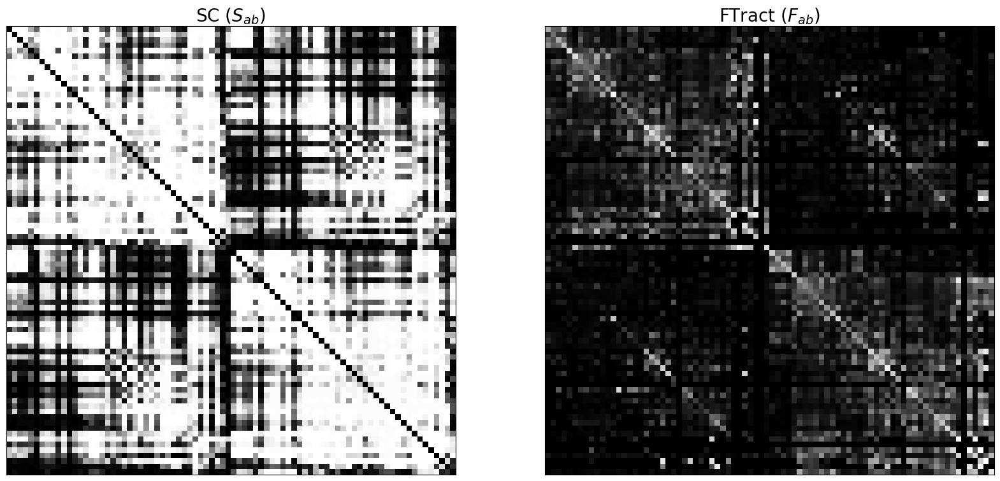

In [7]:
all_types = ["lh", "rh", "lhsc", "rhsc"]
types_rename = ["Left", "Right", "Left-sub", "Right-sub"]
type2num = {t:i for i, t in enumerate(all_types)}

node_type = [type2num[lab.split("-")[0]] for lab in labels]
labels = ["-".join(lab.split("-")[1:]) for lab in labels]

fig, axes = plt.subplots(ncols=2, figsize=(20, 10))

titles = ["SC ($S_{{ab}}$)", "FTract ($F_{{ab}}$)"]
for i, (ax, mat) in enumerate(zip(axes, [bundle_prob, ftract_prob])):
    ax.imshow(np.nan_to_num(mat), cmap="binary_r")
    ax.set_title(titles[i], fontsize=20)
    ax.set_xticks([])
    ax.set_yticks([])

#fig.savefig(op.join(path_to_figures, f"07-Effective-ConnectomeComputation-{delay_max}.png"), dpi=300, bbox_inches="tight")

Directed connectome has shape: (82, 82)


/var/folders/nj/ltrlv15x5jj2jq78pbb2srz80000gn/T/ipykernel_33848/3924005457.py:6: RuntimeWarning: invalid value encountered in divide
  k_matrix = (2 * bundle_prob * ftract_prob)/(ftract_prob + ftract_prob.T)


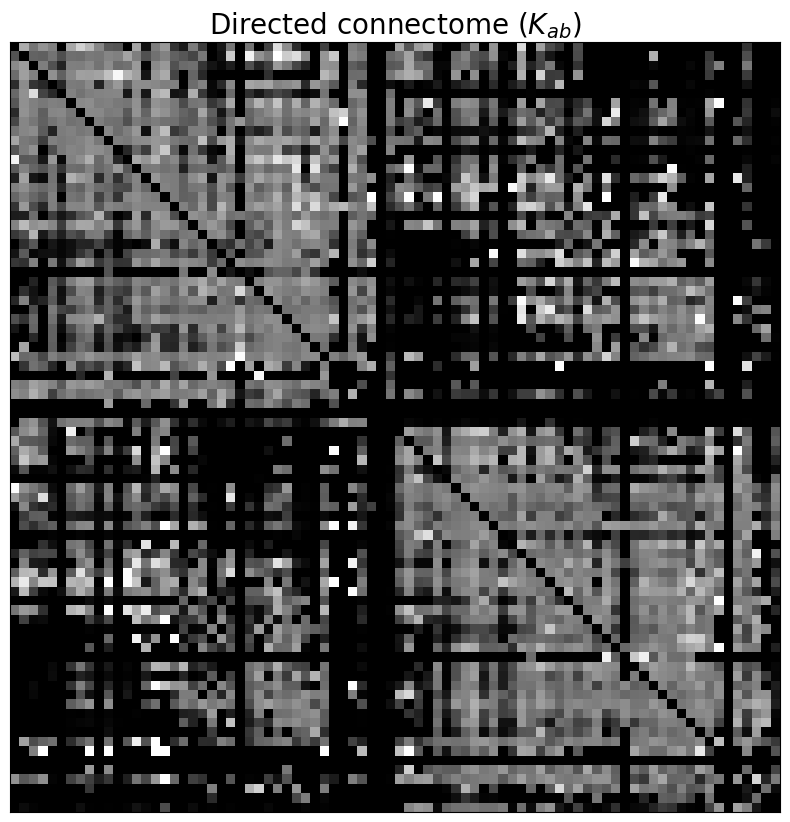

In [9]:
# HERE
# k[i, j] = 2*s[i, j]*f[i,j]/(f[i,j] + f[j,i])

k_threshold = 0.7
#k_matrix = ((2 * (bundle_prob > 0.1).astype(int) * ftract_prob)/(ftract_prob + ftract_prob.T) >= k_threshold).astype(int)
k_matrix = (2 * bundle_prob * ftract_prob)/(ftract_prob + ftract_prob.T)
#k_matrix = ftract_prob
#k_matrix = ((2 * bundle_prob * ftract_prob)/(ftract_prob + ftract_prob.T) >= k_threshold).astype(int)

#k_matrix += k_matrix.T
#k_matrix = (k_matrix > 0).astype(int)

k_matrix = np.nan_to_num(k_matrix)

# k_matrix = (k_matrix > k_threshold).astype(int)

k_matrix -= np.diag(np.diag(k_matrix))

print(f"Directed connectome has shape: {k_matrix.shape}")

fig, axes = plt.subplots(figsize=(10, 10))
axes.imshow(k_matrix, cmap="binary_r")
axes.set_title("Directed connectome ($K_{{ab}}$)", fontsize=20)
axes.set_xticks([])
axes.set_yticks([])

path_to_figures = "/Users/acionca/Google Drive/My Drive/01-Work/01-EDEE/_Candidacy/Figures"
#fig.savefig(op.join(path_to_figures, f"07-Effective-Connectome-{delay_max}.png"), dpi=300, bbox_inches="tight")

s (norm) = 0.0010825105008641202
R^2 = 0.043363461322785034


/var/folders/nj/ltrlv15x5jj2jq78pbb2srz80000gn/T/ipykernel_33848/2800828751.py:49: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for connectionstyle.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, alpha=0.1, pos=graph_pos, edge_color=colors_edges[edge_colors],


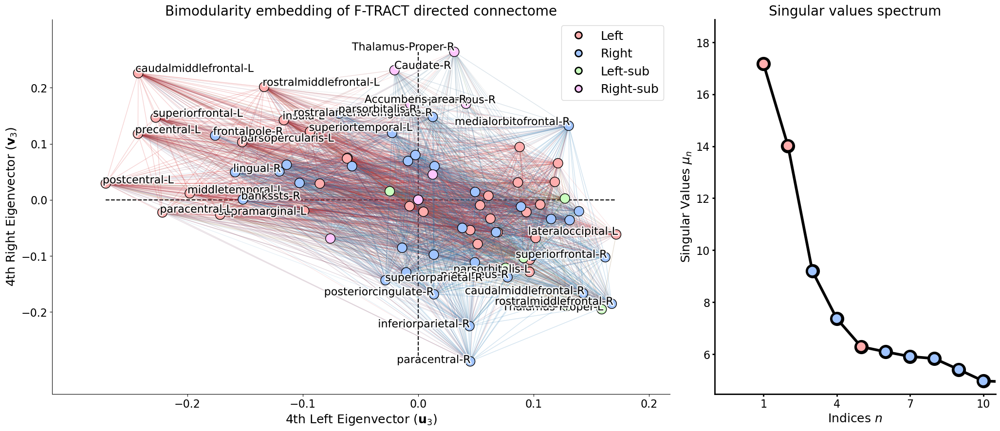

In [14]:
from matplotlib.patheffects import withStroke
from matplotlib.lines import Line2D
import dgsp
import bimod_plots as plot

vec_id = 3
alpha_perc = 40
add_spectrum = False
save_fig = False

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(k_matrix), fix_negative=False)
V = Vh.T

#fig, all_axes = plt.subplots(figsize=(15, 10))
fig, all_axes = plt.subplots(ncols=2, figsize=(25, 10),
                             gridspec_kw={"width_ratios": [2.2, 1], "wspace": 0.1})

if add_spectrum:
    added_ax = fig.add_axes([0.63, 0.17, 0.25, 0.25], facecolor="none")
    added_ax = plot.plot_spectrum(k_matrix, vector_id=vec_id, fix_negative=False,
                                  ax=added_ax, write_s=False, fontscale=1)
    added_ax.set_ylim(4.1, 13.8)
else:
    plot.plot_spectrum(k_matrix, vector_id=vec_id, fix_negative=False,
                       override_title="Singular values spectrum",
                       ax=all_axes[1], write_s=False, fontscale=1)
    # all_axes[1].set_ylim(4.1, 11.8)

axes = all_axes[0]

colors = [palette_rgb[i] for i in node_type]
axes.scatter(U[:, vec_id], V[:, vec_id], s=200, edgecolors="k", lw=1, zorder=2, color=colors)

graph_pos = {i: (U[i, vec_id], V[i, vec_id]) for i in range(k_matrix.shape[0])}

G = nx.DiGraph(k_matrix)

all_dir_edges = G.edges()
edge_colors = np.zeros_like(np.array(all_dir_edges)[:, 0])

for i, (_, target) in enumerate(all_dir_edges):
    edge_colors[i] = node_type[target]

if save_fig:
    G = nx.Graph(k_matrix)
else:
    G = nx.Graph(k_matrix)

nx.draw_networkx_edges(G, alpha=0.1, pos=graph_pos, edge_color=colors_edges[edge_colors],
                       connectionstyle=edge_cs, ax=axes, edgelist=all_dir_edges)

axes.plot([U[:, vec_id].min(), U[:, vec_id].max()], [0]*2, ls="--", c="k", zorder=0)
axes.plot([0]*2, [V[:, vec_id].min(), V[:, vec_id].max()], ls="--", c="k", zorder=0)

squared_rad = U[:, vec_id] ** 2 + V[:, vec_id] ** 2
by_radius = np.argsort(squared_rad)
alpha_vector = (squared_rad > np.percentile(squared_rad, 100-alpha_perc)).astype(int)

left_right = ["L", "R", "L", "R"]
for i, roi in enumerate(labels):
    if True:
        ha = "left"
        if 1.01*U[i, vec_id] > 0:
            ha = "right"
        axes.text(1.01*U[i, vec_id], 1.01*V[i, vec_id], roi+"-"+left_right[node_type[i]],
                  fontsize=16, alpha=alpha_vector[i], ha=ha,
                  path_effects=[
                      withStroke(
                          linewidth=4,
                          foreground="w",
                          alpha=0.8*alpha_vector[i],
                          )])
        
axes.set_title(f"Bimodularity embedding of F-TRACT directed connectome", fontsize=20)
axes.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
axes.set_xticks(np.arange(-.2, .3, .1))
axes.set_yticks(np.arange(-.2, .3, .1))

axes.set_xlabel(f"{vec_id + 1}th Left Eigenvector ($\mathbf{{u}}_{vec_id}$)", fontsize=18)
axes.set_ylabel(f"{vec_id + 1}th Right Eigenvector ($\mathbf{{v}}_{vec_id}$)", fontsize=18)

axes.spines[["top", "right"]].set_visible(False)

legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k", markerfacecolor=palette_rgb[i],
                          markeredgewidth=2, marker="o", label=type) for i, type in enumerate(types_rename)]
axes.legend(handles=legend_elements, fontsize=18)

if save_fig:
    pass
    #fig.savefig(op.join(path_to_figures, f"07-ftract-bimod{vec_id}{'-wSpectrum'*add_spectrum}-SideSpectrum.png"), dpi=300, bbox_inches="tight")

/var/folders/nj/ltrlv15x5jj2jq78pbb2srz80000gn/T/ipykernel_42007/3610182612.py:34: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for connectionstyle.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, alpha=0.1, pos=graph_pos, edge_color=colors_edges[edge_colors],


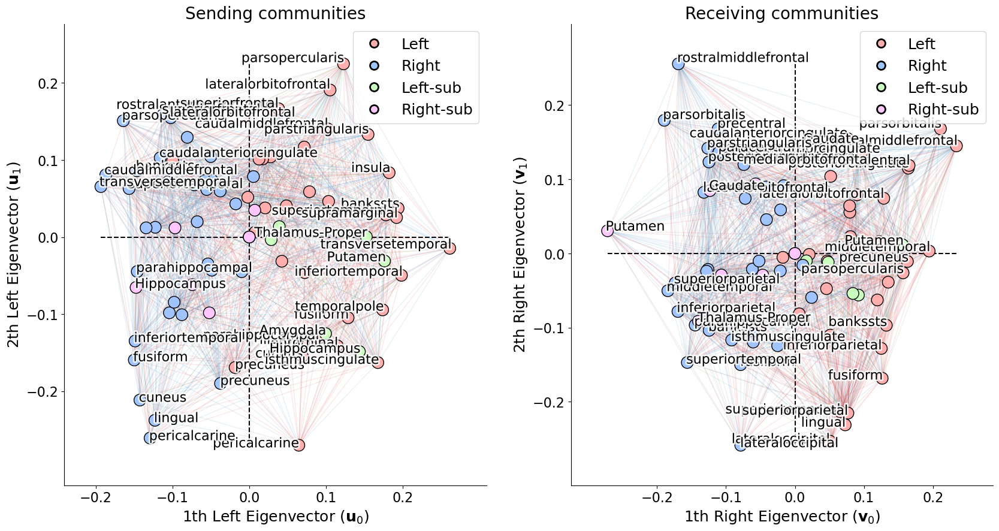

In [31]:
#plot.plot_graph_embedding(k_matrix, node_clusers=np.ones(k_matrix.shape[0]))

vec_id = 0
alpha_perc = 50
second_id = 1
save_fig = False

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(k_matrix), fix_negative=False)
V = Vh.T

fig, all_axes = plt.subplots(ncols=2, figsize=(20, 10))

colors = [palette_rgb[i] for i in node_type]
titles = ["Sending communities", "Receiving communities"]
vect_labels = ["\mathbf{{u}}", "\mathbf{{v}}"]
left_right = ["Left", "Right"]
for j, (axes, vect) in enumerate(zip(all_axes, [U, V])):
    axes.scatter(vect[:, vec_id], vect[:, vec_id+second_id], s=200, edgecolors="k", lw=1, zorder=2, color=colors)

    graph_pos = {i: (vect[i, vec_id], vect[i, vec_id+second_id]) for i in range(k_matrix.shape[0])}

    G = nx.DiGraph(k_matrix)

    edge_colors = np.zeros_like(np.array(G.edges())[:, 0])

    for i, (_, target) in enumerate(G.edges()):
        edge_colors[i] = node_type[target]

    if save_fig:
        G = nx.DiGraph(k_matrix)
    else:
        G = nx.Graph(k_matrix)

    nx.draw_networkx_edges(G, alpha=0.1, pos=graph_pos, edge_color=colors_edges[edge_colors],
                        connectionstyle=edge_cs, ax=axes)

    axes.plot([vect[:, vec_id].min(), vect[:, vec_id].max()], [0]*2, ls="--", c="k", zorder=0)
    axes.plot([0]*2, [vect[:, vec_id+second_id].min(), vect[:, vec_id+second_id].max()], ls="--", c="k", zorder=0)

    squared_rad = vect[:, vec_id] ** 2 + vect[:, vec_id+second_id] ** 2
    by_radius = np.argsort(squared_rad)
    alpha_vector = (squared_rad > np.percentile(squared_rad, 100-alpha_perc)).astype(int)

    for i, roi in enumerate(labels):
        if True:
            ha = "left"
            if 1.01*vect[i, vec_id] > 0:
                ha = "right"
            axes.text(1.01*vect[i, vec_id], 1.01*vect[i, vec_id+second_id], roi, fontsize=16, alpha=alpha_vector[i], ha=ha,
                    path_effects=[
                        withStroke(
                            linewidth=4,
                            foreground="w",
                            alpha=0.8*alpha_vector[i],
                            )])
            
    axes.set_title(titles[j], fontsize=20)
    axes.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
    axes.set_xticks(np.arange(-.2, .3, .1))
    axes.set_yticks(np.arange(-.2, .3, .1))

    axes.set_xlabel(f"{vec_id + 1}th {left_right[j]} Eigenvector (${vect_labels[j]}_{vec_id}$)", fontsize=18)
    axes.set_ylabel(f"{vec_id + second_id + 1}th {left_right[j]} Eigenvector (${vect_labels[j]}_{vec_id + second_id}$)", fontsize=18)

    axes.spines[["top", "right"]].set_visible(False)

    legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k", markerfacecolor=palette_rgb[i],
                            markeredgewidth=2, marker="o", label=type) for i, type in enumerate(types_rename)]
    axes.legend(handles=legend_elements, fontsize=18)

if save_fig:
    fig.savefig(op.join(path_to_figures, f"08-ftract-bimod{vec_id}{vec_id+second_id}-Separated.png"), dpi=300, bbox_inches="tight")

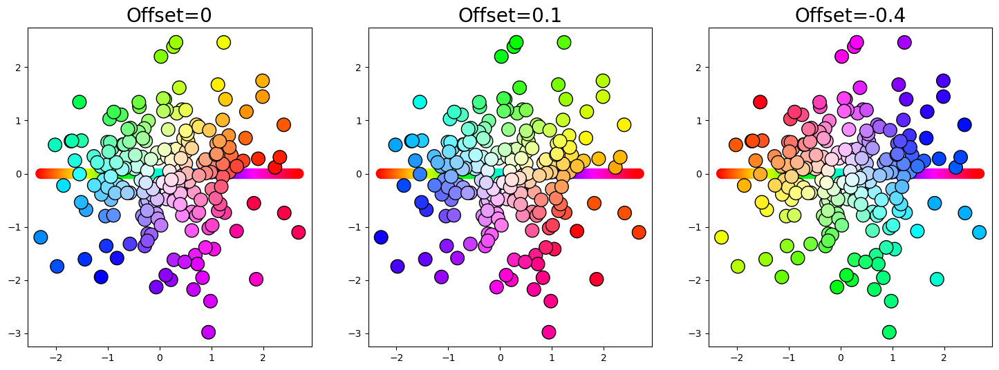

In [15]:
# Understanding the 2D embedding

from matplotlib.colors import hsv_to_rgb

def get_2d_colors(U, V, angle_offset=0, percent_radius=0.6, remove_hemi=None):
    angles = np.arctan2(V, U)

    angles_prop = angles/(2*np.pi)
    angles_prop += angle_offset
    
    angles_prop[angles_prop < 0] = 1+angles_prop[angles_prop < 0]

    if remove_hemi is not None:
        angles_prop[angles_prop > remove_hemi] = angles_prop[angles_prop > remove_hemi] - remove_hemi

    radius = np.sqrt(U**2 + V**2)
    radius = np.clip(radius/(radius.max()*percent_radius), a_min=0, a_max=1)

    colors = [hsv_to_rgb([a, r, 1]) for a, r in zip(angles_prop, radius)]

    return colors, angles_prop

vec_id = 0
alpha_perc = 40
add_spectrum = False
save_fig = False

np.random.seed(10)
rand = np.random.normal(size=(200, 2))
#rand = np.vstack([np.random.normal(loc=-1, scale=0.5, size=(100, 2)), np.random.normal(loc=1, scale=0.5, size=(100, 2))])

U = rand[:, 0]
V = rand[:, 1]

all_offsets = [0, 0.1, -0.4]

fig, axes = plt.subplots(ncols=len(all_offsets), figsize=(6*len(all_offsets), 6))
for offset, ax in zip(all_offsets, axes):
    colors, _ = get_2d_colors(U, V, angle_offset=offset, percent_radius=0.6)

    ax.scatter(U, V, s=200, edgecolors="k", lw=1, zorder=2, color=colors)
    ax.set_title(f"Offset={offset}", fontsize=20)

    x_line = np.arange(len(U))/len(U)
    line_colors = [hsv_to_rgb([a, 1, 1]) for a in x_line]
    ax.scatter(np.linspace(U.min(), U.max(), len(U)), np.zeros_like(U), s=100, color=line_colors, zorder=1)

/var/folders/nj/ltrlv15x5jj2jq78pbb2srz80000gn/T/ipykernel_33848/2934713084.py:103: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for connectionstyle.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, alpha=0.1, pos=graph_pos,


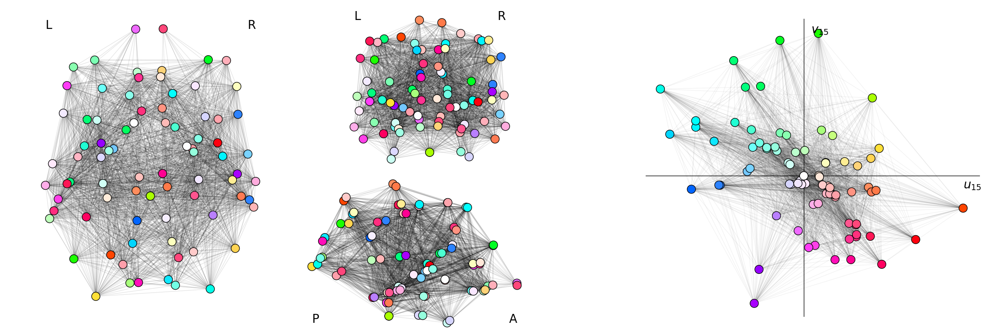

In [20]:
from matplotlib.colors import hsv_to_rgb
from matplotlib.gridspec import GridSpecFromSubplotSpec

vec_id = 15
alpha_perc = 40
add_spectrum = False
save_fig = False

undir = False
remove_hemi = None
#remove_hemi = 0.5
removed_hemi_cmap = "rainbow"
removed_hemi_cmap = "RdYlBu"

if undir:
    mat = k_matrix + k_matrix.T
else:
    mat= k_matrix

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(mat), fix_negative=False)
V = Vh.T

angle_offset = 0.04
angle_offset = 0.08
#angle_offset = -0.4
percent_radius = 0.6

colors, angles_prop = get_2d_colors(U[:, vec_id], V[:, vec_id], angle_offset=angle_offset,
                                    percent_radius=percent_radius, remove_hemi=remove_hemi)

#fig, all_axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15), gridspec_kw={"wspace": 0, "hspace": 0})
fig, all_axes = plt.subplots(ncols=3, figsize=(30, 10), gridspec_kw={"wspace": 0, "width_ratios":[0.8, 0.9, 1], "height_ratios":[0.8]})

#all_axes[1, 1].remove()
#legend_ax = fig.add_axes([0.55, 0.35, 0.25, 0.25], facecolor="none")

gs = GridSpecFromSubplotSpec(nrows=2, ncols=1, subplot_spec=all_axes[1], hspace=0)
all_axes[1].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False, labelsize=16)
all_axes[1].remove()

all_axes = [all_axes[0], fig.add_subplot(gs[0]), fig.add_subplot(gs[1]), all_axes[-1]]

legend_ax = all_axes[-1]
legend_ax.spines[:].set_visible(False)

if remove_hemi is None:
    legend_ax.scatter(U[:, vec_id], V[:, vec_id], s=200, edgecolors="k", lw=1, zorder=2, color=colors)
else:
    legend_ax.scatter(U[:, vec_id], V[:, vec_id], s=200, edgecolors="k", lw=1, zorder=2, c=angles_prop, cmap=removed_hemi_cmap, vmin=0, vmax=0.3)

legend_ax.plot([1.1*U[:, vec_id].min(), 1.1*U[:, vec_id].max()], [0]*2, ls="-", lw=2, alpha=0.5, c="k", zorder=0)
legend_ax.plot([0]*2, [1.1*V[:, vec_id].min(), 1.1*V[:, vec_id].max()], ls="-", lw=2, alpha=0.5, c="k", zorder=0)

for x, y, t in zip([U[:, vec_id].max(), -0.05*U[:, vec_id].min()],
                   [0.1*V[:, vec_id].min(), V[:, vec_id].max()],
                   [f"$u_{{{vec_id}}}$", f"$v_{{{vec_id}}}$"]):
    legend_ax.text(x, y, t, fontsize=20)

G = nx.DiGraph(mat)

edge_colors = np.zeros_like(np.array(G.edges())[:, 0])
for i, (_, target) in enumerate(G.edges()):
    edge_colors[i] = node_type[target]

graph_pos = {i: (U[i, vec_id], V[i, vec_id]) for i in range(mat.shape[0])}
G = nx.Graph(mat)
nx.draw_networkx_edges(G, alpha=0.05, pos=graph_pos, # edge_color=colors_edges[edge_colors],
                       ax=legend_ax)#, connectionstyle=edge_cs)

view_names = ["Axial", "Coronal", "Sagittal"]
pos_tuples = [(0, 1, 2), (0, 2, 1), (1, 2, 0)]
maxrange_x = [(-80, 80), (-100, 150), (-100, 150)]
maxrange_y = [(-110, 80), (-45, 70), (-45, 70)]
for ax_i, axes in enumerate(all_axes[:-1]):

    pos_x = node_centers[:, pos_tuples[ax_i][0]]
    pos_y = node_centers[:, pos_tuples[ax_i][1]]

    size_mapping = node_centers[:, pos_tuples[ax_i][2]]
    size_mapping = 200 + 50*size_mapping/size_mapping.max()
    size_mapping = np.full_like(size_mapping, 200)
    sort_by_depth = np.flip(np.argsort(size_mapping))

    if remove_hemi is None:
        axes.scatter(pos_x[sort_by_depth], pos_y[sort_by_depth], s=size_mapping, edgecolors="k",
                    lw=1, zorder=2, color=np.array(colors)[sort_by_depth])
    else:
        print(angles_prop.min(), angles_prop.max())
        axes.scatter(pos_x[sort_by_depth], pos_y[sort_by_depth], s=size_mapping, edgecolors="k",
                     lw=1, zorder=2, c=angles_prop[sort_by_depth], cmap=removed_hemi_cmap, vmin=0, vmax=0.25)

    graph_pos = {i: (pos_x[i], pos_y[i]) for i in range(mat.shape[0])}

    G = nx.DiGraph(mat)

    edge_colors = np.zeros_like(np.array(G.edges())[:, 0])

    for i, (_, target) in enumerate(G.edges()):
        edge_colors[i] = node_type[target]

    G = nx.Graph(mat)

    nx.draw_networkx_edges(G, alpha=0.1, pos=graph_pos,
                           connectionstyle=edge_cs, ax=axes)

    squared_rad = U[:, vec_id] ** 2 + V[:, vec_id] ** 2
    by_radius = np.argsort(squared_rad)
    alpha_vector = (squared_rad > np.percentile(squared_rad, 100-alpha_perc)).astype(int)

    for i, roi in enumerate(labels):
        if False:
            ha = "left"
            if 1.01*U[i, vec_id] > 0:
                ha = "right"
            #axes.text(1.01*U[i, vec_id], 1.01*V[i, vec_id], roi, fontsize=16, alpha=alpha_vector[i], ha=ha,
            axes.text(node_centers[i, 0], node_centers[i, 1], roi, fontsize=16, alpha=alpha_vector[i], ha=ha,
                    path_effects=[
                        withStroke(
                            linewidth=4,
                            foreground="w",
                            alpha=0.8*alpha_vector[i],
                            )])

    #axes.spines[["top", "right"]].set_visible(False)
    axes.spines[:].set_visible(False)
    axes.set_xlim(maxrange_x[ax_i])
    axes.set_ylim(maxrange_y[ax_i])

    #legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
    #                        markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(types_rename)]
    #axes.legend(handles=legend_elements, fontsize=18)

all_axes[0].text(node_centers[:, 0].min(), node_centers[:, 1].max(), "L", fontsize=20)
all_axes[0].text(node_centers[:, 0].max(), node_centers[:, 1].max(), "R", ha="right", fontsize=20)

all_axes[1].text(node_centers[:, 0].min(), node_centers[:, 2].max(), "L", fontsize=20)
all_axes[1].text(node_centers[:, 0].max(), node_centers[:, 2].max(), "R", ha="right", fontsize=20)

all_axes[2].text(node_centers[:, 1].min(), node_centers[:, 2].min(), "P", fontsize=20)
all_axes[2].text(node_centers[:, 1].max(), node_centers[:, 2].min(), "A", ha="right", fontsize=20)

if save_fig:
    fig.savefig(op.join(path_to_figures, f"09-ftract-bimod{'-undir'*undir}{vec_id}{'noHemi'*(remove_hemi is not None)}-Brain.png"),
                dpi=300, bbox_inches="tight")

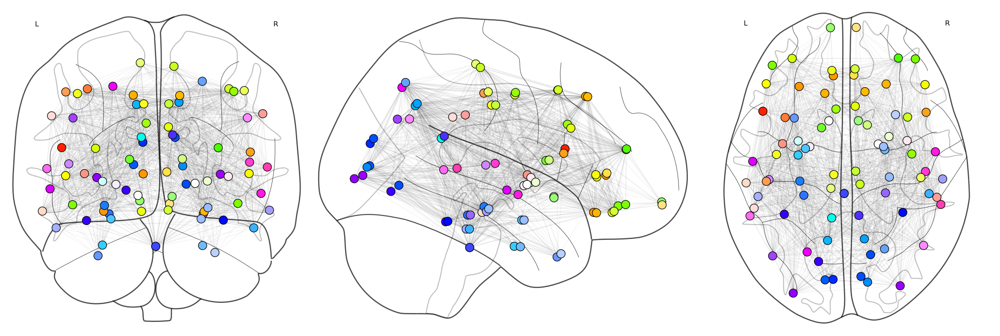

In [35]:
from nilearn.plotting import plot_connectome

if remove_hemi is  None:
    no_hemi_colors = colors    
else:
    jetcmap = plt.get_cmap(removed_hemi_cmap, 32)
    no_hemi_colors = [jetcmap(int(100*a)) for a in angles_prop]

fig, axes = plt.subplots(figsize=(30, 10))
plot_connectome((k_matrix+k_matrix.T > 0).astype(int), node_centers, node_color=no_hemi_colors, node_size=200,
                node_kwargs={"edgecolors":"k", "linewidths":1}, 
                edge_kwargs={"lw":1, "alpha":0.05}, edge_cmap="binary_r", edge_vmin=1, edge_vmax=2,
                axes=axes)

if save_fig:
    fig.savefig(op.join(path_to_figures, f"10-ftract-bimod{'-undir'*undir}{vec_id}{'noHemi'*(remove_hemi is not None)}-BrainContour.png"),
                dpi=300, bbox_inches="tight")

In [36]:
import nibabel as nib
from nilearn.surface import vol_to_surf
from nilearn.plotting import plot_surf_stat_map

from skimage.filters.rank import mean
from skimage.segmentation import expand_labels

path_to_ressources = "/Users/acionca/code/effectivedelay_estimation/resources"

path_to_mesh = op.join(path_to_ressources, "brainmesh")

# Load the mesh files and store the vertices and faces IDs
all_vertices = []
all_faces = []
n_faces = 0
for mesh_file, sign_factor in zip(["Test_smth_LH.nv", "Test_smth_RH.nv"], [1, -1]):
    #with open(op.join(path_to_mesh, "Test_smth_LH.nv"), 'r') as f:
    with open(op.join(path_to_mesh, mesh_file), 'r') as f:
        data = f.read().splitlines()
    n_vertices = int(data[0])

    all_vertices += [row.split(" ") for row in data[1:n_vertices+1]]
    all_faces_array = np.array([(row.split(" ")) for row in data[n_vertices+2:]])
    all_faces += (all_faces_array.astype(int) + n_faces).tolist()

    n_faces = all_faces_array.astype(int).max()

# Convert to Numpy arrays
all_vertices = np.array(all_vertices, dtype=float)
all_faces = np.array(all_faces, dtype=int) - 1

In [37]:
path_to_atlas = op.join(path_to_ressources, "roi_atlas-ftract-scale1-GM.nii.gz")
roi_atlas = nib.load(path_to_atlas)
atlas_data = roi_atlas.get_fdata()

stat_map = np.zeros_like(atlas_data, dtype=float)
for i, roi in enumerate(labels):
    stat_map[atlas_data == i+1] = angles_prop[i]

n_smooth = 1
#stat_map = mean(stat_map, np.ones((n_smooth, n_smooth, n_smooth)))

stat_map = expand_labels(stat_map, 3)

surf_map = nib.Nifti1Image(stat_map, roi_atlas.affine)
#surf_map.header.set_data_dtype(np.float32)

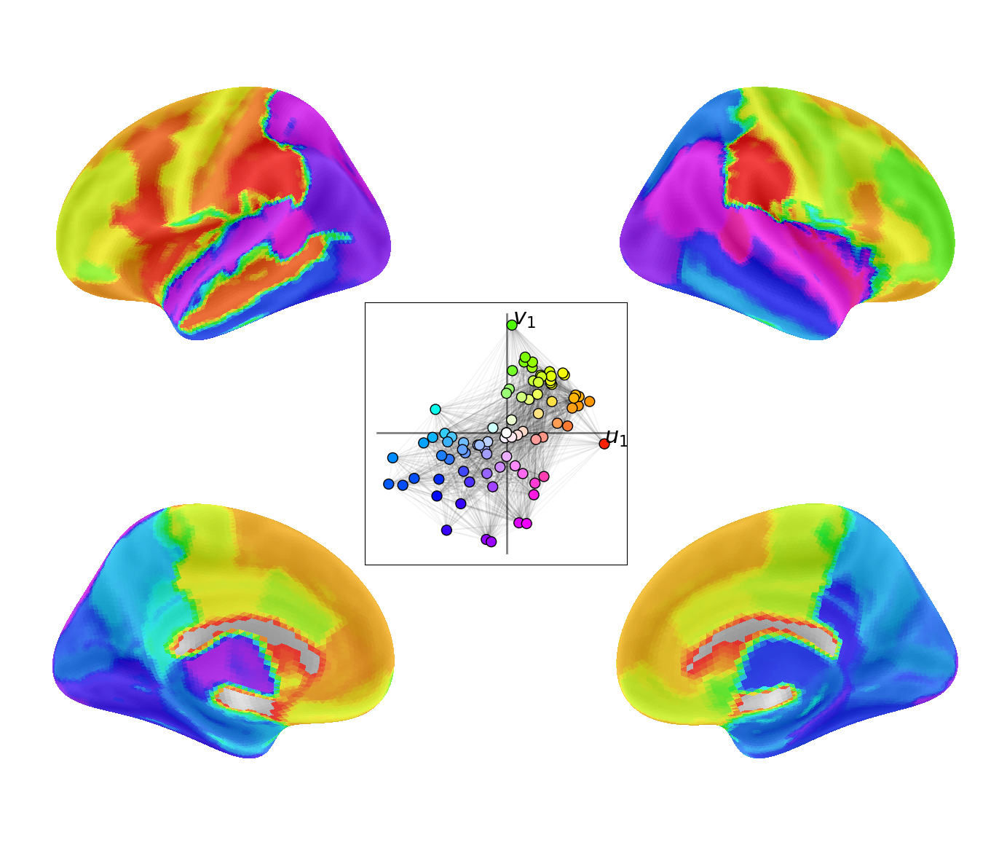

In [38]:
from nilearn import datasets

fsaverage = datasets.fetch_surf_fsaverage("fsaverage5")

inflate = True

surf_cmap = removed_hemi_cmap if remove_hemi is not None else "hsv"
max_value = stat_map.max() if remove_hemi is not None else 1
max_value = 0.3 if remove_hemi is not None else 1

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 15), subplot_kw={"projection": "3d"}, gridspec_kw={"wspace": 0, "hspace": 0})

hemis = ["left", "right"]
surf_def = [fsaverage.pial_left, fsaverage.pial_right]
if inflate:
    hemis_def = [fsaverage.infl_left, fsaverage.infl_right]
else:
    hemis_def = [fsaverage.pial_left, fsaverage.pial_right]
bgs = [fsaverage.sulc_left, fsaverage.sulc_right]

views = ["lateral", "medial"]

for ax_i, ax in enumerate(axes.flatten()):
    texture = vol_to_surf(surf_map, surf_def[ax_i % 2], interpolation="nearest")
    figure = plot_surf_stat_map(hemis_def[ax_i % 2],
                                texture,
                                hemi=hemis[ax_i % 2],
                                view=views[ax_i // 2],
                                colorbar=((remove_hemi is not None) and bool(ax_i % 2)),
                                threshold=1e-4,
                                bg_map=bgs[ax_i % 2],
                                cmap=surf_cmap,
                                bg_on_data=True,
                                darkness=1,
                                vmax=max_value,
                                axes=ax)
    
ax_proj = fig.add_axes([0.42, 0.37, 0.18, 0.24], facecolor="none")
ax_proj.set_xticks([])
ax_proj.set_yticks([])

if remove_hemi is None:
    ax_proj.scatter(U[:, vec_id], V[:, vec_id], s=100, edgecolors="k", lw=1, zorder=2, color=colors)
else:
    ax_proj.scatter(U[:, vec_id], V[:, vec_id], s=100, edgecolors="k", lw=1, zorder=2, c=angles_prop,
                    cmap=removed_hemi_cmap, vmax=max_value)

graph_pos = {i: (U[i, vec_id], V[i, vec_id]) for i in range(mat.shape[0])}
G = nx.Graph(mat)
nx.draw_networkx_edges(G, alpha=0.05, pos=graph_pos, # edge_color=colors_edges[edge_colors],
                       ax=ax_proj)#, connectionstyle=edge_cs)

ax_proj.plot([1.1*U[:, vec_id].min(), 1.1*U[:, vec_id].max()], [0]*2, ls="-", lw=2, alpha=0.5, c="k", zorder=0)
ax_proj.plot([0]*2, [1.1*V[:, vec_id].min(), 1.1*V[:, vec_id].max()], ls="-", lw=2, alpha=0.5, c="k", zorder=0)

for x, y, t in zip([U[:, vec_id].max(), -0.05*U[:, vec_id].min()],
                   [0.1*V[:, vec_id].min(), V[:, vec_id].max()],
                   [f"$u_{{{vec_id}}}$", f"$v_{{{vec_id}}}$"]):
    ax_proj.text(x, y, t, fontsize=22)

#fig.savefig(op.join(path_to_figures, f"12-ftract-bimod{'-undir'*undir}{vec_id}{'noHemi'*(remove_hemi is not None)}-Surface{fig.get_size_inches()}.png"),
#            dpi=300, bbox_inches="tight")